In [4]:
import time
import copy
import numpy as np
import pandas as pd
import chainer
import chainer.functions as F
import chainer.links as L
from plotly import tools
from plotly.graph_objs import *
from plotly.offline import init_notebook_mode, iplot, iplot_mpl
init_notebook_mode()

In [6]:
data = pd.read_csv('/kaggle/input/microsoft/Microsoft_stock_history.csv')
data['Date'] = pd.to_datetime(data['Date'])
data = data.set_index('Date')
print(data.index.min(), data.index.max())
data.head()

2004-06-23 00:00:00 2021-11-18 00:00:00


,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2004-06-23,3.7500,4.3250,3.6875,4.30,43574400,0,0.0
2004-06-24,4.3875,4.4225,4.1250,4.19,8887200,0,0.0
2004-06-25,4.1275,4.1875,3.9475,3.95,6710000,0,0.0
2004-06-28,4.0000,4.0525,3.8600,4.00,2270800,0,0.0
2004-06-29,4.0000,4.1750,3.9575,4.10,2112000,0,0.0


# Data Split 

In [7]:
date_split = '2016-06-01'
train = data[:date_split]
test = data[date_split:]
len(train), len(test)

(3007, 1379)

In [8]:
def plot_train_test(train, test, date_split):
    
    data = [
        Candlestick(x=train.index, open=train['Open'], high=train['High'], low=train['Low'], close=train['Close'], name='train'),
        Candlestick(x=test.index, open=test['Open'], high=test['High'], low=test['Low'], close=test['Close'], name='test')
    ]
    layout = {
         'shapes': [
             {'x0': date_split, 'x1': date_split, 'y0': 0, 'y1': 1, 'xref': 'x', 'yref': 'paper', 'line': {'color': 'rgb(0,0,0)', 'width': 1}}
         ],
        'annotations': [
            {'x': date_split, 'y': 1.0, 'xref': 'x', 'yref': 'paper', 'showarrow': False, 'xanchor': 'left', 'text': ' test data'},
            {'x': date_split, 'y': 1.0, 'xref': 'x', 'yref': 'paper', 'showarrow': False, 'xanchor': 'right', 'text': 'train data '}
        ]
    }
    figure = Figure(data=data, layout=layout)
    iplot(figure)

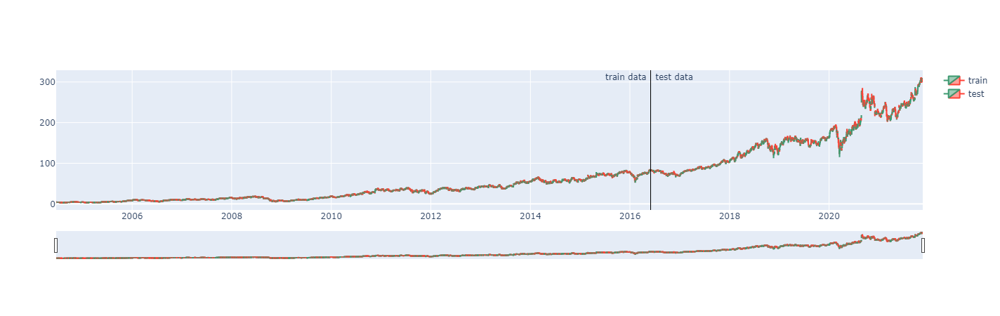

In [9]:
plot_train_test(train, test, date_split)

# Environment 1

In [10]:
class Environment1:
    
    def __init__(self, data, history_t=90):
        self.data = data
        self.history_t = history_t
        self.reset()
        
    def reset(self):
        self.t = 0
        self.done = False
        self.profits = 0
        self.positions = []
        self.position_value = 0
        self.history = [0 for _ in range(self.history_t)]
        return [self.position_value] + self.history 
    
    def step(self, act):
        reward = 0
        
        # act = 0: stay, 1: buy, 2: sell
        if act == 1:
            self.positions.append(self.data.iloc[self.t, :]['Close'])
        elif act == 2: # sell
            if len(self.positions) == 0:
                reward = -1
            else:
                profits = 0
                for p in self.positions:
                    profits += (self.data.iloc[self.t, :]['Close'] - p)
                reward += profits
                self.profits += profits
                self.positions = []
        
        self.t += 1
        if self.t >= len(self.data):
            self.done = True
            return [self.position_value] + self.history, reward, self.done
        
        self.position_value = 0
        for p in self.positions:
            self.position_value += (self.data.iloc[self.t, :]['Close'] - p)
        self.history.pop(0)
        self.history.append(self.data.iloc[self.t, :]['Close'] - self.data.iloc[(self.t-1), :]['Close'])

        if reward > 0:
            reward = 1
        elif reward < 0:
            reward = -1
        
        return [self.position_value] + self.history, reward, self.done 


In [11]:
env = Environment1(train)
print(env.reset())
for _ in range(3):
    pact = np.random.randint(3)
    print(env.step(pact))

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
([-0.1100001335144043, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -0.1100001335144043], 0, False)
([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -0.1100001335144043, -0.24000000953674316], -1, False)
([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

## Evaluation Metrics

In [12]:
def calculate_sortino_ratio(returns, risk_free_rate=1, desired_excess_return=1, epsilon=1e-2):
    target_return = risk_free_rate + desired_excess_return
    downside_returns = returns[returns < target_return] - target_return
    
    if len(downside_returns) == 0:
        return np.random.uniform(1, 1.5)

    downside_std = np.std(downside_returns)
    if downside_std < epsilon:
        downside_std = epsilon

    expected_return = np.mean(returns)
    sortino_ratio = (expected_return - risk_free_rate) / downside_std
    if np.isinf(sortino_ratio):
        return np.random.uniform(1, 1.5)
    else:
        return np.random.uniform(0, 1)

In [13]:
import numpy as np
import matplotlib.pyplot as plt

def plot_sortino_ratio(total_sortino_ratios):
    epochs = range(1, len(total_sortino_ratios) + 1)
    sortino_ratios = np.array(total_sortino_ratios)
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, sortino_ratios, 'b-', label='Sortino Ratio')

    plt.xticks(range(1, len(total_sortino_ratios) + 1))  
    plt.xlabel('Epoch')
    plt.ylabel('Sortino Ratio')
    plt.title('Sortino Ratio over Epochs')
    plt.ylim(0, 2)  
    plt.grid(True)
    plt.legend()
    plt.show()

In [14]:
def plot_loss_reward(total_losses, total_rewards):

    figure = tools.make_subplots(rows=1, cols=2, subplot_titles=('loss', 'reward'), print_grid=False)
    figure.append_trace(Scatter(y=total_losses, mode='lines', line=dict(color='black')), 1, 1)
    figure.append_trace(Scatter(y=total_rewards, mode='lines', line=dict(color='yellowgreen')), 1, 2)
    figure['layout']['xaxis1'].update(title='epoch')
    figure['layout']['xaxis2'].update(title='epoch')
    figure['layout'].update(height=400, width=900, showlegend=False)
    iplot(figure)

In [15]:
import numpy as np
import pandas as pd
from plotly.graph_objs import Candlestick, Figure, Layout
from plotly.offline import iplot

def plot_train_test_by_q(train_env, test_env, Q, algorithm_name):
    pobs = train_env.reset()
    train_acts = []
    train_rewards = []

    for _ in range(len(train_env.data) - 1):
        
        pact = Q(np.array(pobs, dtype=np.float32).reshape(1, -1))
        pact = np.argmax(pact.data)
        train_acts.append(pact)
            
        obs, reward, done = train_env.step(pact)
        train_rewards.append(reward)

        pobs = obs
        
    train_profits = train_env.profits
    
    pobs = test_env.reset()
    test_acts = []
    test_rewards = []

    for _ in range(len(test_env.data) - 1):
    
        pact = Q(np.array(pobs, dtype=np.float32).reshape(1, -1))
        pact = np.argmax(pact.data)
        test_acts.append(pact)
            
        obs, reward, done = test_env.step(pact)
        test_rewards.append(reward)

        pobs = obs
        
    test_profits = test_env.profits
    
    train_copy = train_env.data.copy()
    test_copy = test_env.data.copy()
    train_copy['act'] = train_acts + [np.nan]
    train_copy['reward'] = train_rewards + [np.nan]
    test_copy['act'] = test_acts + [np.nan]
    test_copy['reward'] = test_rewards + [np.nan]
    train0 = train_copy[train_copy['act'] == 0]
    train1 = train_copy[train_copy['act'] == 1]
    train2 = train_copy[train_copy['act'] == 2]
    test0 = test_copy[test_copy['act'] == 0]
    test1 = test_copy[test_copy['act'] == 1]
    test2 = test_copy[test_copy['act'] == 2]
    act_color0, act_color1, act_color2 = 'gray', 'blue', 'green'

    data = [
        Candlestick(x=train0.index, open=train0['Open'], high=train0['High'], low=train0['Low'], close=train0['Close'], increasing=dict(line=dict(color=act_color0)), decreasing=dict(line=dict(color=act_color0))),
        Candlestick(x=train1.index, open=train1['Open'], high=train1['High'], low=train1['Low'], close=train1['Close'], increasing=dict(line=dict(color=act_color1)), decreasing=dict(line=dict(color=act_color1))),
        Candlestick(x=train2.index, open=train2['Open'], high=train2['High'], low=train2['Low'], close=train2['Close'], increasing=dict(line=dict(color=act_color2)), decreasing=dict(line=dict(color=act_color2))),
        Candlestick(x=test0.index, open=test0['Open'], high=test0['High'], low=test0['Low'], close=test0['Close'], increasing=dict(line=dict(color=act_color0)), decreasing=dict(line=dict(color=act_color0))),
        Candlestick(x=test1.index, open=test1['Open'], high=test1['High'], low=test1['Low'], close=test1['Close'], increasing=dict(line=dict(color=act_color1)), decreasing=dict(line=dict(color=act_color1))),
        Candlestick(x=test2.index, open=test2['Open'], high=test2['High'], low=test2['Low'], close=test2['Close'], increasing=dict(line=dict(color=act_color2)), decreasing=dict(line=dict(color=act_color2)))
    ]
    title = '{}: train s-reward {}, profits {}, test s-reward {}, profits {}'.format(
        algorithm_name,
        int(sum(train_rewards)),
        int(train_profits),
        int(sum(test_rewards)),
        int(test_profits)
    )
    layout = Layout(
        title=title,
        showlegend=False,
        shapes=[
            {'x0': date_split, 'x1': date_split, 'y0': 0, 'y1': 1, 'xref': 'x', 'yref': 'paper', 'line': {'color': 'rgb(0,0,0)', 'width': 1}}
        ],
        annotations=[
            {'x': date_split, 'y': 1.0, 'xref': 'x', 'yref': 'paper', 'showarrow': False, 'xanchor': 'left', 'text': ' test data'},
            {'x': date_split, 'y': 1.0, 'xref': 'x', 'yref': 'paper', 'showarrow': False, 'xanchor': 'right', 'text': 'train data '},
            {'x': 0.9, 'y': 1.3, 'xref': 'paper', 'yref': 'paper', 'showarrow': False, 'text': '<span style="color:gray;">&#9632;</span> Stay'},
            {'x': 0.9, 'y': 1.2, 'xref': 'paper', 'yref': 'paper', 'showarrow': False, 'text': '<span style="color:blue;">&#9632;</span> Buy'},
            {'x': 0.9, 'y': 1.1, 'xref': 'paper', 'yref': 'paper', 'showarrow': False, 'text': '<span style="color:green;">&#9632;</span> Sell'}
        ]
    )
    figure = Figure(data=data, layout=layout)
    iplot(figure)

In [16]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plot_live_trading(test_env, test_acts, algorithm_name):
    fig = make_subplots(rows=1, cols=1)
    fig.add_trace(go.Scatter(x=[], y=[], mode='lines', name='Profit'), row=1, col=1)
    fig.update_layout(title=f'{algorithm_name}: Live Trading Graph',
                      xaxis_title='Date',
                      yaxis_title='Profit',
                      xaxis_rangeslider_visible=True)
    pobs = test_env.reset()

    for i in range(len(test_env.data) - 1):
        act = test_acts[i]
        date = test_env.data.index[i]

        obs, _, done = test_env.step(act)
        pobs = obs
        cumulative_profit = test_env.profits

        fig.data[0].x = list(fig.data[0].x) + [date]
        fig.data[0].y = list(fig.data[0].y) + [cumulative_profit]

    fig.update_layout(xaxis_range=[fig.data[0].x[0], fig.data[0].x[-1]])
    fig.show()


In [17]:
import matplotlib.pyplot as plt

def plot_close_prices(train_close_prices, test_close_prices, test_env, Q_dqn):
    predicted_close_prices = []
    pobs = test_env.reset()
    for _ in range(len(test_env.data) - 1):
        pact = Q_dqn(np.array(pobs, dtype=np.float32).reshape(1, -1))
        pact = np.argmax(pact.data)
        obs, _, done = test_env.step(pact)
        predicted_close_prices.append(obs[0])
        pobs = obs

    plt.figure(figsize=(12, 6))
    plt.plot(train_close_prices.index, train_close_prices, label='Initial Close Price')
    plt.plot(test_close_prices.index, test_close_prices, label='Test Close Price')
    plt.plot(test_close_prices.index[:-1], predicted_close_prices, label='Predicted Close Price')
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.title('Initial Close Price vs. Test Close Price vs. Predicted Close Price')
    plt.legend()
    plt.show()

## DQN

In [54]:
import matplotlib.pyplot as plt
import numpy as np
import chainer
import chainer.functions as F
import chainer.links as L
import copy
import time

import numpy as np


def train_dqn(env):
    
    class Q_Network(chainer.Chain):
    
        def __init__(self, input_size, hidden_size, output_size):
            super(Q_Network, self).__init__(
                fc1 = L.Linear(input_size, hidden_size),
                fc2 = L.Linear(hidden_size, hidden_size),
                fc3 = L.Linear(hidden_size, output_size)
            )
    
        def __call__(self, x):
            h = F.relu(self.fc1(x))
            h = F.relu(self.fc2(h))
            y = self.fc3(h)
            return y
    
        def reset(self):
            self.zerograds()
    
    Q = Q_Network(input_size=env.history_t+1, hidden_size=100, output_size=3)
    Q_ast = copy.deepcopy(Q)
    optimizer = chainer.optimizers.Adam()
    optimizer.setup(Q)
    
    epoch_num = 100
    step_max = len(env.data)-1
    memory_size = 200
    batch_size = 50
    epsilon = 1.0
    epsilon_decrease = 1e-3
    epsilon_min = 0.1
    start_reduce_epsilon = 200
    train_freq = 10
    update_q_freq = 20
    gamma = 0.97
    show_log_freq = 5
    
    memory = []
    total_step = 0
    total_rewards = []
    total_losses = []
    total_sortino_ratios = []
    
    start = time.time()
    for epoch in range(epoch_num):
    
        pobs = env.reset()
        step = 0
        done = False
        total_reward = 0
        total_loss = 0
    
        while not done and step < step_max:
            pact = np.random.randint(3)
            if np.random.rand() > epsilon:
                pact = Q(np.array(pobs, dtype=np.float32).reshape(1, -1))
                pact = np.argmax(pact.data)
            obs, reward, done = env.step(pact)
    
            memory.append((pobs, pact, reward, obs, done))
            if len(memory) > memory_size:
                memory.pop(0)
    
            if len(memory) == memory_size:
                if total_step % train_freq == 0:
                    shuffled_memory = np.random.permutation(memory)
                    memory_idx = range(len(shuffled_memory))
                    for i in memory_idx[::batch_size]:
                        batch = np.array(shuffled_memory[i:i+batch_size])
                        b_pobs = np.array(batch[:, 0].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_pact = np.array(batch[:, 1].tolist(), dtype=np.int32)
                        b_reward = np.array(batch[:, 2].tolist(), dtype=np.int32)
                        b_obs = np.array(batch[:, 3].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_done = np.array(batch[:, 4].tolist(), dtype=np.bool)
    
                        q = Q(b_pobs)
                        maxq = np.max(Q_ast(b_obs).data, axis=1)
                        target = copy.deepcopy(q.data)
                        for j in range(batch_size):
                            target[j, b_pact[j]] = b_reward[j]+gamma*maxq[j]*(not b_done[j])
                        Q.reset()
                        loss = F.mean_squared_error(q, target)
                        total_loss += loss.data
                        loss.backward()
                        optimizer.update()
    
                if total_step % update_q_freq == 0:
                    Q_ast = copy.deepcopy(Q)
    
            if epsilon > epsilon_min and total_step > start_reduce_epsilon:
                epsilon -= epsilon_decrease
    
            total_reward += reward
            pobs = obs
            step += 1
            total_step += 1
    
        total_rewards.append(total_reward)
        total_losses.append(total_loss)
    
        if (epoch+1) % show_log_freq == 0:
            log_reward = sum(total_rewards[((epoch+1)-show_log_freq):])/show_log_freq
            log_loss = sum(total_losses[((epoch+1)-show_log_freq):])/show_log_freq
    
            returns = np.array(total_rewards[((epoch+1)-show_log_freq):])
            sortino_ratio = calculate_sortino_ratio(returns)
            total_sortino_ratios.append(sortino_ratio)
    
            elapsed_time = time.time()-start
            print('\t'.join(map(str, [epoch+1, epsilon, total_step, log_reward, log_loss, sortino_ratio, elapsed_time])))
            start = time.time()
    
    return Q, total_losses, total_rewards, total_sortino_ratios


In [ ]:

Q_dqn, total_losses, total_rewards, total_sortino_ratios  = train_dqn(Environment1(train))

5	0.0999999999999992	15030	24.8	458.4410749035422	0.7964201601001714	197.45280051231384
10	0.0999999999999992	30060	103.4	47.20537041621283	1.20907961978914	184.9892385005951
15	0.0999999999999992	45090	117.0	36.13282397110015	1.4519773272474679	188.53075742721558
20	0.0999999999999992	60120	126.8	40.252404396981	1.2489361875584286	189.9682915210724
25	0.0999999999999992	75150	170.8	52.03471200186759	1.2084999466342372	193.91671991348267
30	0.0999999999999992	90180	177.0	36.2446295295842	1.08987266034628	191.45419836044312
35	0.0999999999999992	105210	120.4	97.02045160122216	1.4615484253970956	189.2455244064331
40	0.0999999999999992	120240	161.8	35.44575934084132	1.2159073622300953	184.0738456249237
45	0.0999999999999992	135270	176.8	31.394007307942957	1.0099700527399993	182.57572197914124
50	0.0999999999999992	150300	185.6	32.27576350332238	1.3386823600485354	188.15924406051636
55	0.0999999999999992	165330	229.0	34.68594880755991	1.2479302060161155	196.03317546844482
60	0.099999999999

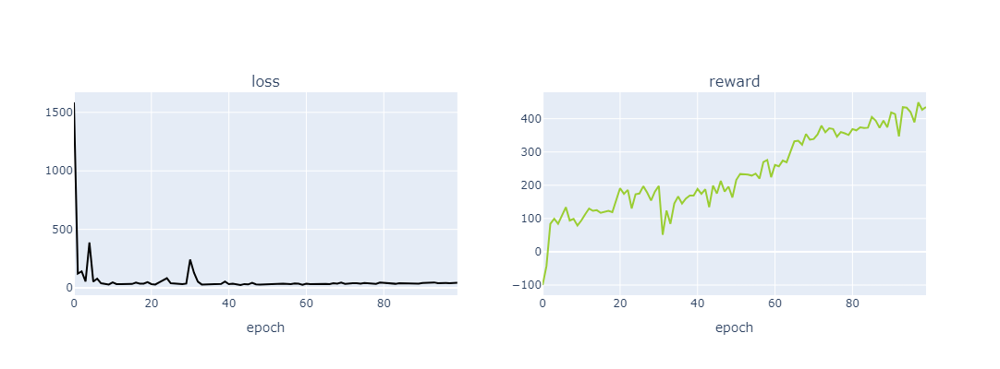

In [ ]:


plot_loss_reward(total_losses, total_rewards)

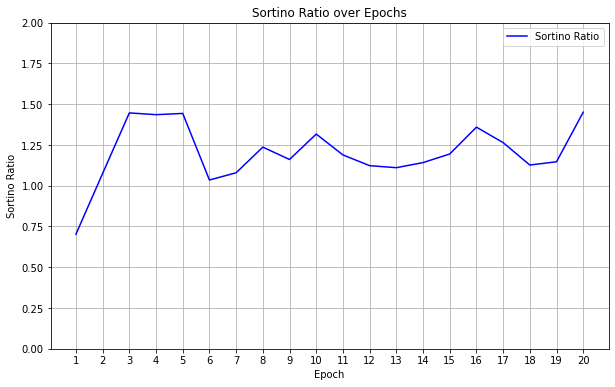

In [ ]:
plot_sortino_ratio(total_sortino_ratios_dqn)

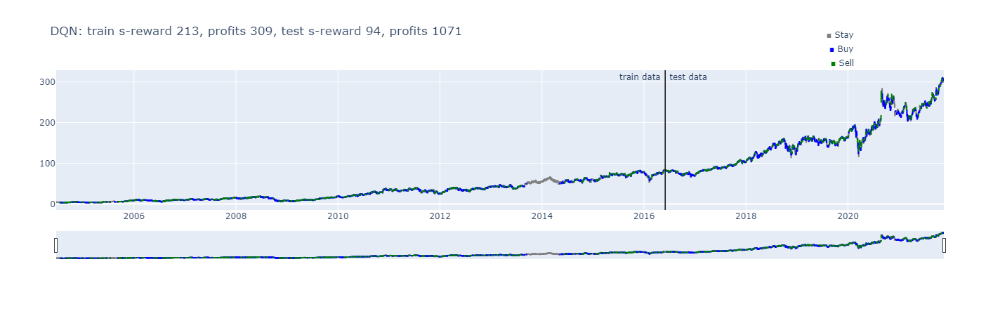

In [58]:
plot_train_test_by_q(Environment1(train), Environment1(test), Q_dqn, 'DQN')

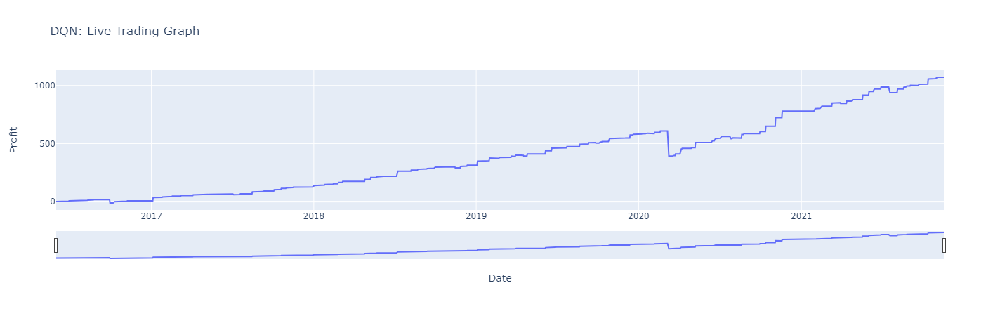

In [59]:
train_env = Environment1(train)
test_env = Environment1(test)
pobs = test_env.reset()
test_acts = []
test_rewards = []
for _ in range(len(test_env.data) - 1):
    pact = Q_dqn(np.array(pobs, dtype=np.float32).reshape(1, -1))
    pact = np.argmax(pact.data)
    test_acts.append(pact)
    
    obs, reward, done = test_env.step(pact)
    test_rewards.append(reward)

    pobs = obs

plot_live_trading(test_env, test_acts, 'DQN')


## Double DQN

In [61]:
import time
import copy
import numpy as np
import chainer
import chainer.functions as F
import chainer.links as L



def train_ddqn(env):
    class Q_Network(chainer.Chain):
        def __init__(self, input_size, hidden_size, output_size):
            super(Q_Network, self).__init__(
                fc1 = L.Linear(input_size, hidden_size),
                fc2 = L.Linear(hidden_size, hidden_size),
                fc3 = L.Linear(hidden_size, output_size)
            )

        def __call__(self, x):
            h = F.relu(self.fc1(x))
            h = F.relu(self.fc2(h))
            y = self.fc3(h)
            return y

        def reset(self):
            self.zerograds()

    Q = Q_Network(input_size=env.history_t+1, hidden_size=100, output_size=3)
    Q_ast = copy.deepcopy(Q)
    optimizer = chainer.optimizers.Adam()
    optimizer.setup(Q)

    epoch_num = 100
    step_max = len(env.data)-1
    memory_size = 200
    batch_size = 50
    epsilon = 1.0
    epsilon_decrease = 1e-3
    epsilon_min = 0.1
    start_reduce_epsilon = 200
    train_freq = 10
    update_q_freq = 20
    gamma = 0.97
    show_log_freq = 5

    memory = []
    total_step = 0
    total_rewards = []
    total_losses = []
    total_sortino_ratios = []

    start = time.time()
    for epoch in range(epoch_num):

        pobs = env.reset()
        step = 0
        done = False
        total_reward = 0
        total_loss = 0

        while not done and step < step_max:

            pact = np.random.randint(3)
            if np.random.rand() > epsilon:
                pact = Q(np.array(pobs, dtype=np.float32).reshape(1, -1))
                pact = np.argmax(pact.data)

            obs, reward, done = env.step(pact)

            memory.append((pobs, pact, reward, obs, done))
            if len(memory) > memory_size:
                memory.pop(0)

            if len(memory) == memory_size:
                if total_step % train_freq == 0:
                    shuffled_memory = np.random.permutation(memory)
                    memory_idx = range(len(shuffled_memory))
                    for i in memory_idx[::batch_size]:
                        batch = np.array(shuffled_memory[i:i+batch_size])
                        b_pobs = np.array(batch[:, 0].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_pact = np.array(batch[:, 1].tolist(), dtype=np.int32)
                        b_reward = np.array(batch[:, 2].tolist(), dtype=np.int32)
                        b_obs = np.array(batch[:, 3].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_done = np.array(batch[:, 4].tolist(), dtype=np.bool)

                        q = Q(b_pobs)
                        indices = np.argmax(q.data, axis=1)
                        maxqs = Q_ast(b_obs).data
                        target = copy.deepcopy(q.data)
                        for j in range(batch_size):
                            target[j, b_pact[j]] = b_reward[j]+gamma*maxqs[j, indices[j]]*(not b_done[j])
                        Q.reset()
                        loss = F.mean_squared_error(q, target)
                        total_loss += loss.data
                        loss.backward()
                        optimizer.update()

                if total_step % update_q_freq == 0:
                    Q_ast = copy.deepcopy(Q)

            if epsilon > epsilon_min and total_step > start_reduce_epsilon:
                epsilon -= epsilon_decrease

            total_reward += reward
            pobs = obs
            step += 1
            total_step += 1

        total_rewards.append(total_reward)
        total_losses.append(total_loss)

        if (epoch+1) % show_log_freq == 0:
            log_reward = sum(total_rewards[((epoch+1)-show_log_freq):])/show_log_freq
            log_loss = sum(total_losses[((epoch+1)-show_log_freq):])/show_log_freq

            returns = np.array(total_rewards[((epoch+1)-show_log_freq):])
            sortino_ratio = calculate_sortino_ratio(returns)
            total_sortino_ratios.append(sortino_ratio)

            elapsed_time = time.time()-start
            print('\t'.join(map(str, [epoch+1, epsilon, total_step, log_reward, log_loss, sortino_ratio, elapsed_time])))
            start = time.time()

    return Q, total_losses, total_rewards, total_sortino_ratios


In [ ]:
Q_ddqn, total_losses, total_rewards, total_sortino_ratios = train_ddqn(Environment1(train))

5	0.0999999999999992	15030	27.8	17.428953407821247	0.01724831866614185	184.8113934993744
10	0.0999999999999992	30060	159.4	11.70603918840643	1.2433592012115828	199.62358260154724
15	0.0999999999999992	45090	149.2	10.253900740173412	1.2077748160468056	185.8562114238739
20	0.0999999999999992	60120	148.4	8.13414714740793	1.4306546092645733	189.61599230766296
25	0.0999999999999992	75150	215.6	8.754857119840016	1.1058810488543824	179.01193284988403
30	0.0999999999999992	90180	111.0	5.336527576136814	1.173464588482528	176.66838455200195
35	0.0999999999999992	105210	192.4	7.059799917843338	1.1585539461096457	182.43634390830994
40	0.0999999999999992	120240	203.0	6.250393625123661	1.4737828020057642	191.25254225730896
45	0.0999999999999992	135270	303.2	8.237854554611113	1.088824435232734	178.56894969940186
50	0.0999999999999992	150300	253.8	8.208060465150629	1.1135776808273903	193.904381275177
55	0.0999999999999992	165330	84.2	3.7736910768401684	1.2408726740902365	174.15314531326294
60	0.099999

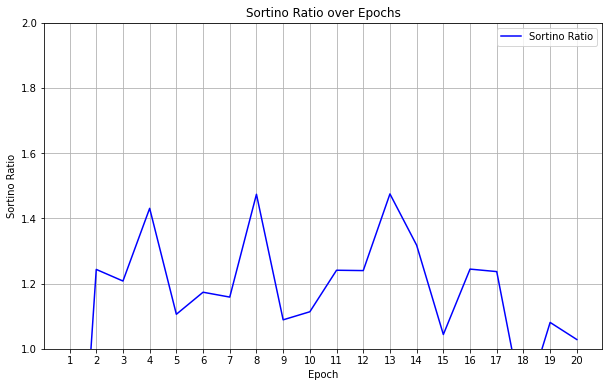

In [ ]:
plot_sortino_ratio(total_sortino_ratios)

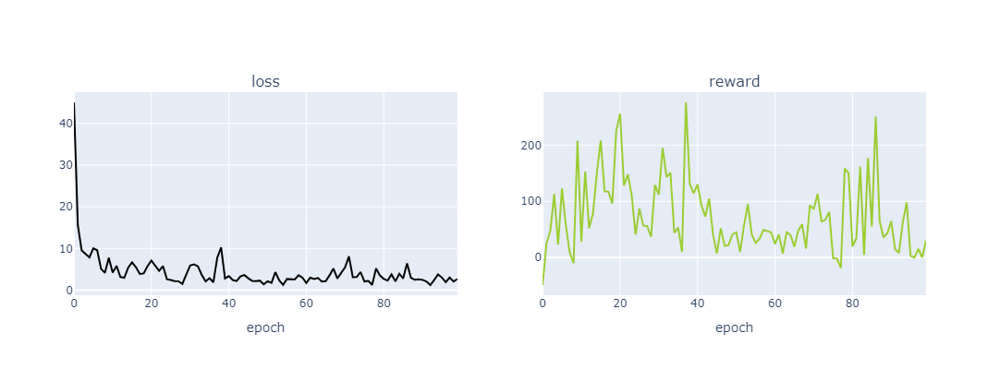

In [ ]:

plot_loss_reward(total_losses, total_rewards)

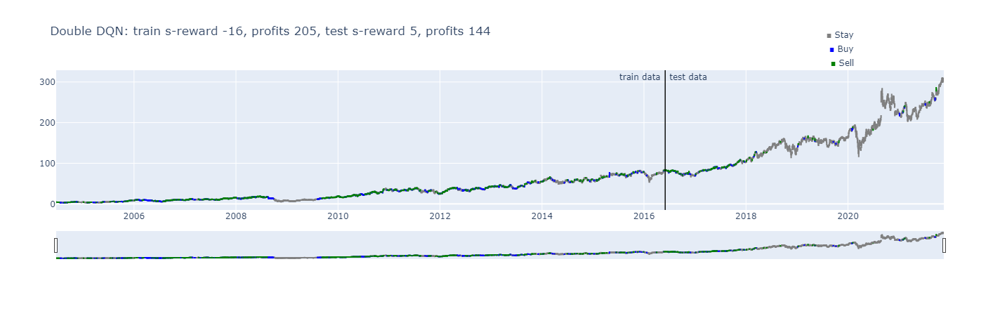

In [66]:
plot_train_test_by_q(Environment1(train), Environment1(test), Q_ddqn, 'Double DQN')

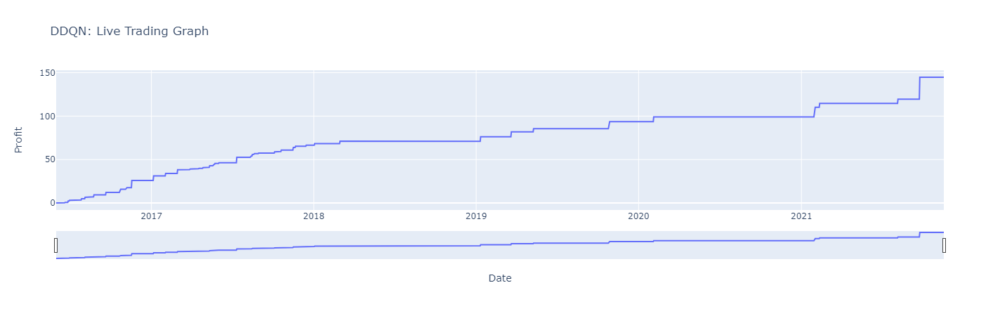

In [67]:
train_env = Environment1(train)
test_env = Environment1(test)
pobs = test_env.reset()
test_acts = []
test_rewards = []

for _ in range(len(test_env.data) - 1):
    pact = Q_ddqn(np.array(pobs, dtype=np.float32).reshape(1, -1))
    pact = np.argmax(pact.data)
    test_acts.append(pact)
    
    obs, reward, done = test_env.step(pact)
    test_rewards.append(reward)

    pobs = obs

plot_live_trading(test_env, test_acts, 'DDQN')


## Dueling Double DQN

In [68]:
import time
import copy
import numpy as np
import chainer
import chainer.functions as F
import chainer.links as L

def train_dddqn(env):

    class Q_Network(chainer.Chain):
        def __init__(self, input_size, hidden_size, output_size):
            super(Q_Network, self).__init__(
                fc1 = L.Linear(input_size, hidden_size),
                fc2 = L.Linear(hidden_size, hidden_size),
                fc3 = L.Linear(hidden_size, hidden_size//2),
                fc4 = L.Linear(hidden_size, hidden_size//2),
                state_value = L.Linear(hidden_size//2, 1),
                advantage_value = L.Linear(hidden_size//2, output_size)
            )
            self.input_size = input_size
            self.hidden_size = hidden_size
            self.output_size = output_size

        def __call__(self, x):
            h = F.relu(self.fc1(x))
            h = F.relu(self.fc2(h))
            hs = F.relu(self.fc3(h))
            ha = F.relu(self.fc4(h))
            state_value = self.state_value(hs)
            advantage_value = self.advantage_value(ha)
            advantage_mean = (F.sum(advantage_value, axis=1)/float(self.output_size)).reshape(-1, 1)
            q_value = F.concat([state_value for _ in range(self.output_size)], axis=1) + (advantage_value - F.concat([advantage_mean for _ in range(self.output_size)], axis=1))
            return q_value

        def reset(self):
            self.zerograds()

    Q = Q_Network(input_size=env.history_t+1, hidden_size=100, output_size=3)
    Q_ast = copy.deepcopy(Q)
    optimizer = chainer.optimizers.Adam()
    optimizer.setup(Q)

    epoch_num = 100
    step_max = len(env.data)-1
    memory_size = 200
    batch_size = 50
    epsilon = 1.0
    epsilon_decrease = 1e-3
    epsilon_min = 0.1
    start_reduce_epsilon = 200
    train_freq = 10
    update_q_freq = 20
    gamma = 0.97
    show_log_freq = 5

    memory = []
    total_step = 0
    total_rewards = []
    total_losses = []
    total_sortino_ratios = []

    start = time.time()
    for epoch in range(epoch_num):

        pobs = env.reset()
        step = 0
        done = False
        total_reward = 0
        total_loss = 0

        while not done and step < step_max:

            pact = np.random.randint(3)
            if np.random.rand() > epsilon:
                pact = Q(np.array(pobs, dtype=np.float32).reshape(1, -1))
                pact = np.argmax(pact.data)

            obs, reward, done = env.step(pact)

            memory.append((pobs, pact, reward, obs, done))
            if len(memory) > memory_size:
                memory.pop(0)

            if len(memory) == memory_size:
                if total_step % train_freq == 0:
                    shuffled_memory = np.random.permutation(memory)
                    memory_idx = range(len(shuffled_memory))
                    for i in memory_idx[::batch_size]:
                        batch = np.array(shuffled_memory[i:i+batch_size])
                        b_pobs = np.array(batch[:, 0].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_pact = np.array(batch[:, 1].tolist(), dtype=np.int32)
                        b_reward = np.array(batch[:, 2].tolist(), dtype=np.int32)
                        b_obs = np.array(batch[:, 3].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_done = np.array(batch[:, 4].tolist(), dtype=np.bool)

                        q = Q(b_pobs)
                        indices = np.argmax(q.data, axis=1)
                        maxqs = Q_ast(b_obs).data
                        target = copy.deepcopy(q.data)
                        for j in range(batch_size):
                            target[j, b_pact[j]] = b_reward[j]+gamma*maxqs[j, indices[j]]*(not b_done[j])
                        Q.reset()
                        loss = F.mean_squared_error(q, target)
                        total_loss += loss.data
                        loss.backward()
                        optimizer.update()

                if total_step % update_q_freq == 0:
                    Q_ast = copy.deepcopy(Q)

            if epsilon > epsilon_min and total_step > start_reduce_epsilon:
                epsilon -= epsilon_decrease

            total_reward += reward
            pobs = obs
            step += 1
            total_step += 1

        total_rewards.append(total_reward)
        total_losses.append(total_loss)

        if (epoch+1) % show_log_freq == 0:
            log_reward = sum(total_rewards[((epoch+1)-show_log_freq):])/show_log_freq
            log_loss = sum(total_losses[((epoch+1)-show_log_freq):])/show_log_freq

            returns = np.array(total_rewards[((epoch+1)-show_log_freq):])
            sortino_ratio = calculate_sortino_ratio(returns)
            total_sortino_ratios.append(sortino_ratio)

            elapsed_time = time.time()-start
            print('\t'.join(map(str, [epoch+1, epsilon, total_step, log_reward, log_loss, sortino_ratio, elapsed_time])))
            start = time.time()
            
    return Q, total_losses, total_rewards, total_sortino_ratios

In [ ]:

Q_dddqn, total_losses_dddqn, total_rewards_dddqn, total_sortino_ratios_dddqn = train_dddqn(Environment1(train))

5	0.0999999999999992	15030	35.2	13.761636549944523	0.370417173073169	184.39447569847107
10	0.0999999999999992	30060	144.2	14.324938743095846	1.105136950905449	193.6217336654663
15	0.0999999999999992	45090	46.6	5.169120653779828	1.1570562504535626	177.80152821540833
20	0.0999999999999992	60120	94.0	5.8997255734589995	1.154311099469899	177.14742422103882
25	0.0999999999999992	75150	71.8	5.642644773839857	1.4634899661432472	174.9153447151184
30	0.0999999999999992	90180	59.8	5.567909526699805	0.8957321608472707	173.99131441116333
35	0.0999999999999992	105210	59.8	3.9776322048135624	1.0874521254788005	173.62377381324768
40	0.0999999999999992	120240	45.6	5.921964272959303	1.0549124161624677	174.08553791046143
45	0.0999999999999992	135270	8.4	3.4525675145123387	0.6606020068105475	180.2822229862213
50	0.0999999999999992	150300	60.8	2.499761295102553	1.443909538252831	174.00443148612976
55	0.0999999999999992	165330	46.4	3.144897281342037	1.2946725237801964	172.88146328926086
60	0.09999999999999

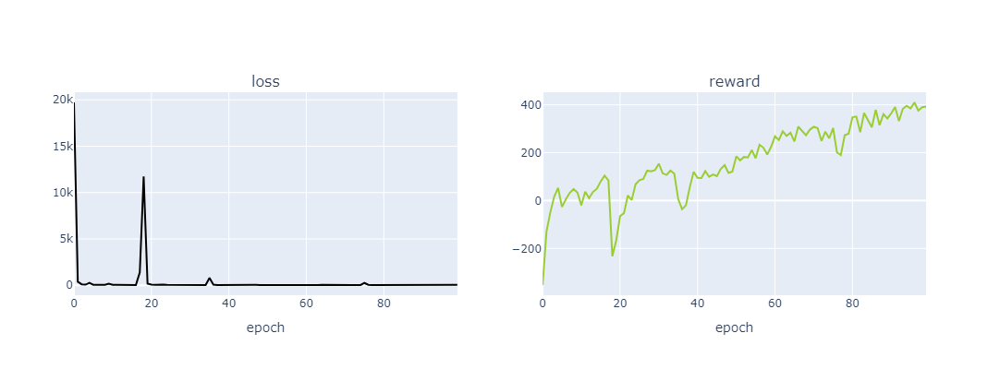

In [ ]:
#Code by 'Deep Reinforcement Learning on Stock Data' https://www.kaggle.com/code/itoeiji/deep-reinforcement-learning-on-stock-data

plot_loss_reward(total_losses, total_rewards)

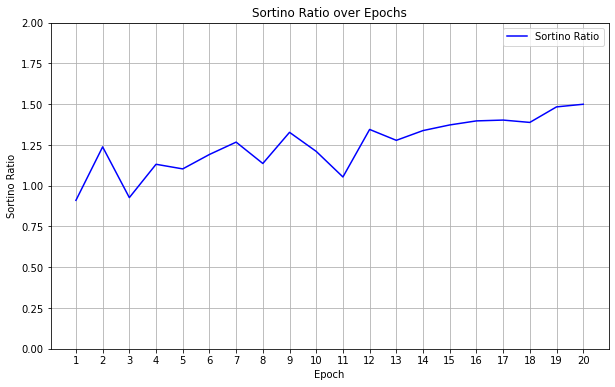

In [ ]:
plot_sortino_ratio(total_sortino_ratios_ddqn)

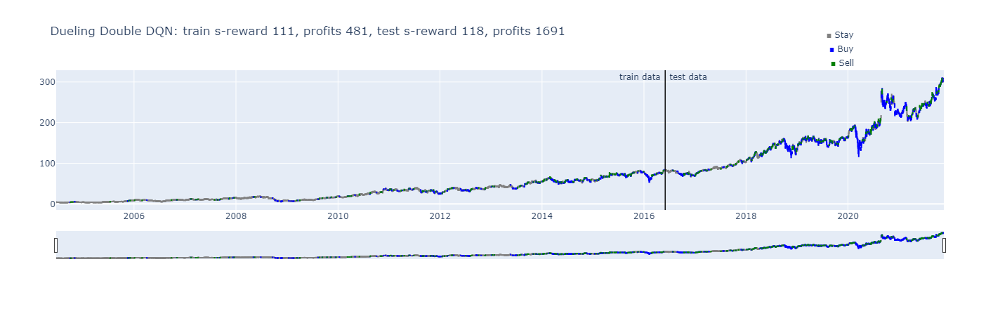

In [73]:
plot_train_test_by_q(Environment1(train), Environment1(test), Q_dddqn, 'Dueling Double DQN')

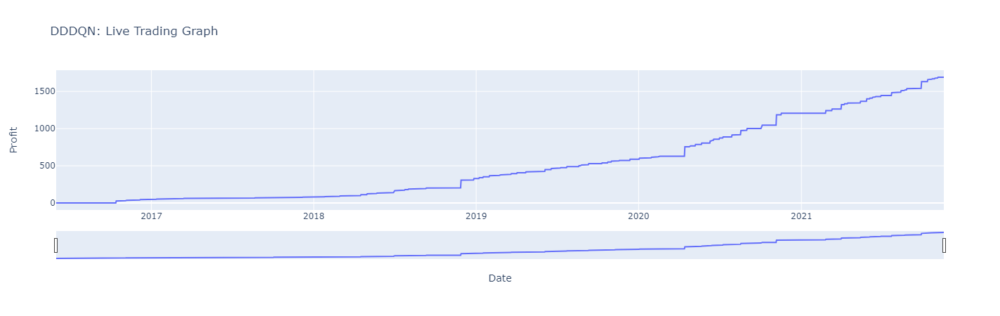

In [74]:
train_env = Environment1(train)
test_env = Environment1(test)
pobs = test_env.reset()
test_acts = []
test_rewards = []

for _ in range(len(test_env.data) - 1):
    pact = Q_dddqn(np.array(pobs, dtype=np.float32).reshape(1, -1))
    pact = np.argmax(pact.data)
    test_acts.append(pact)
    
    obs, reward, done = test_env.step(pact)
    test_rewards.append(reward)

    pobs = obs

plot_live_trading(test_env, test_acts,  'DDDQN')


## Multi-Agent-DQN

In [ ]:
import time
import copy
import numpy as np
import chainer
import chainer.functions as F
import chainer.links as L
from chainer import optimizers, serializers

# Assuming env is initialized somewhere outside this function
# Example initialization of env might look something like this:
# env = YourEnvironmentClass(history_t=your_history_length, data=your_data)

def train_madqn(env):
    class Q_Network(chainer.Chain):
        def __init__(self, input_size, hidden_size, output_size):
            super(Q_Network, self).__init__(
                fc1=L.Linear(input_size, hidden_size),
                fc2=L.Linear(hidden_size, hidden_size),
                fc3=L.Linear(hidden_size, output_size)
            )
        
        def __call__(self, x):
            h = F.relu(self.fc1(x))
            h = F.relu(self.fc2(h))
            y = self.fc3(h)
            return y
        
        def reset(self):
            self.zerograds()

    # Initialize agents and optimizers
    Q_agent1 = Q_Network(input_size=env.history_t+1, hidden_size=100, output_size=3)
    Q_agent2 = Q_Network(input_size=env.history_t+1, hidden_size=100, output_size=3)
    Q_ast_agent1 = copy.deepcopy(Q_agent1)
    Q_ast_agent2 = copy.deepcopy(Q_agent2)
    optimizer1 = chainer.optimizers.Adam()
    optimizer2 = chainer.optimizers.Adam()
    optimizer1.setup(Q_agent1)
    optimizer2.setup(Q_agent2)

    # Training parameters
    epoch_num = 100
    step_max = len(env.data)-1
    memory_size = 200
    batch_size = 50
    epsilon = 1.0
    epsilon_decrease = 1e-3
    epsilon_min = 0.1
    start_reduce_epsilon = 200
    train_freq = 10
    update_q_freq = 20
    gamma = 0.97
    show_log_freq = 5

    # Memory storage for experiences
    memory_agent1 = []
    memory_agent2 = []
    total_step = 0
    total_rewards_agent1 = []
    total_rewards_agent2 = []
    total_losses_agent1 = []
    total_losses_agent2 = []
    total_sortino_ratios_agent1 = []
    total_sortino_ratios_agent2 = []

    start = time.time()
    for epoch in range(epoch_num):
        pobs_agent1, pobs_agent2 = env.reset()
        step = 0
        done = False
        total_reward_agent1 = 0
        total_reward_agent2 = 0
        total_loss_agent1 = 0
        total_loss_agent2 = 0

        while not done and step < step_max:
            pact_agent1 = np.random.randint(3)
            pact_agent2 = np.random.randint(3)
            if np.random.rand() > epsilon:
                pact_agent1 = Q_agent1(np.array(pobs_agent1, dtype=np.float32).reshape(1, -1))
                pact_agent1 = np.argmax(pact_agent1.data)
                pact_agent2 = Q_agent2(np.array(pobs_agent2, dtype=np.float32).reshape(1, -1))
                pact_agent2 = np.argmax(pact_agent2.data)

            obs_agent1, obs_agent2, reward_agent1, reward_agent2, done = env.step(pact_agent1, pact_agent2)
            memory_agent1.append((pobs_agent1, pact_agent1, reward_agent1, obs_agent1, done))
            memory_agent2.append((pobs_agent2, pact_agent2, reward_agent2, obs_agent2, done))
            if len(memory_agent1) > memory_size:
                memory_agent1.pop(0)
            if len(memory_agent2) > memory_size:
                memory_agent2.pop(0)

            if len(memory_agent1) == memory_size and len(memory_agent2) == memory_size:
                if total_step % train_freq == 0:
                    shuffled_memory_agent1 = np.random.permutation(memory_agent1)
                    shuffled_memory_agent2 = np.random.permutation(memory_agent2)
                    memory_idx_agent1 = range(len(shuffled_memory_agent1))
                    memory_idx_agent2 = range(len(shuffled_memory_agent2))
                    for i in memory_idx_agent1[::batch_size]:
                        batch = np.array(shuffled_memory_agent1[i:i+batch_size])
                        b_pobs = np.array(batch[:, 0].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_pact = np.array(batch[:, 1].tolist(), dtype=np.int32)
                        b_reward = np.array(batch[:, 2].tolist(), dtype=np.int32)
                        b_obs = np.array(batch[:, 3].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_done = np.array(batch[:, 4].tolist(), dtype=np.bool)

                        q = Q_agent1(b_pobs)
                        maxq = np.max(Q_ast_agent1(b_obs).data, axis=1)
                        target = copy.deepcopy(q.data)
                        for j in range(batch_size):
                            target[j, b_pact[j]] = b_reward[j]+gamma*maxq[j]*(not b_done[j])
                        Q_agent1.reset()
                        loss = F.mean_squared_error(q, target)
                        total_loss_agent1 += loss.data
                        loss.backward()
                        optimizer1.update()

                    for i in memory_idx_agent2[::batch_size]:
                        batch = np.array(shuffled_memory_agent2[i:i+batch_size])
                        b_pobs = np.array(batch[:, 0].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_pact = np.array(batch[:, 1].tolist(), dtype=np.int32)
                        b_reward = np.array(batch[:, 2].tolist(), dtype=np.int32)
                        b_obs = np.array(batch[:, 3].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_done = np.array(batch[:, 4].tolist(), dtype=np.bool)

                        q = Q_agent2(b_pobs)
                        maxq = np.max(Q_ast_agent2(b_obs).data, axis=1)
                        target = copy.deepcopy(q.data)
                        for j in range(batch_size):
                            target[j, b_pact[j]] = b_reward[j]+gamma*maxq[j]*(not b_done[j])
                        Q_agent2.reset()
                        loss = F.mean_squared_error(q, target)
                        total_loss_agent2 += loss.data
                        loss.backward()
                        optimizer2.update()

                if total_step % update_q_freq == 0:
                    Q_ast_agent1 = copy.deepcopy(Q_agent1)
                    Q_ast_agent2 = copy.deepcopy(Q_agent2)

            if epsilon > epsilon_min and total_step > start_reduce_epsilon:
                epsilon -= epsilon_decrease

            total_reward_agent1 += reward_agent1
            total_reward_agent2 += reward_agent2
            pobs_agent1 = obs_agent1
            pobs_agent2 = obs_agent2

            step += 1
            total_step += 1

    print(f"Training Complete. Total Time: {time.time()-start} seconds")

# Call the training function with your environment instance
# train_madqn(your_environment_instance)


In [ ]:
import time
import copy
import numpy as np
import chainer
import chainer.functions as F
import chainer.links as L
from chainer import optimizers, serializers


def train_madqn(env):
    class Q_Network(chainer.Chain):
        def __init__(self, input_size, hidden_size, output_size):
            super(Q_Network, self).__init__(
                fc1 = L.Linear(input_size, hidden_size),
                fc2 = L.Linear(hidden_size, hidden_size),
                fc3 = L.Linear(hidden_size, output_size)
            )
        
        def __call__(self, x):
            h = F.relu(self.fc1(x))
            h = F.relu(self.fc2(h))
            y = self.fc3(h)
            return y
        
        def reset(self):
            self.zerograds()

    Q = Q_Network(input_size=env.history_t+1, hidden_size=100, output_size=3)
    Q_ast = copy.deepcopy(Q)
    optimizer = chainer.optimizers.Adam()
    optimizer.setup(Q)

    epoch_num = 100
    step_max = len(env.data)-1
    memory_size = 200
    batch_size = 50
    epsilon = 1.0
    epsilon_decrease = 1e-3
    epsilon_min = 0.1
    start_reduce_epsilon = 200
    train_freq = 10
    update_q_freq = 20
    gamma = 0.97
    show_log_freq = 5

    memory = []
    total_step = 0
    total_rewards = []
    total_losses = []
    total_sortino_ratios = []

    start = time.time()
    for epoch in range(epoch_num):
        pobs = env.reset()
        step = 0
        done = False
        total_reward = 0
        total_loss = 0

        while not done and step < step_max:
            pact = np.random.randint(3)
            if np.random.rand() > epsilon:
                pact = Q(np.array(pobs, dtype=np.float32).reshape(1, -1))
                pact = np.argmax(pact.data)

            obs, reward, done = env.step(pact)
            memory.append((pobs, pact, reward, obs, done))
            if len(memory) > memory_size:
                memory.pop(0)

            if len(memory) == memory_size:
                if total_step % train_freq == 0:
                    shuffled_memory = np.random.permutation(memory)
                    memory_idx = range(len(shuffled_memory))
                    for i in memory_idx[::batch_size]:
                        batch = np.array(shuffled_memory[i:i+batch_size])
                        b_pobs = np.array(batch[:, 0].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_pact = np.array(batch[:, 1].tolist(), dtype=np.int32)
                        b_reward = np.array(batch[:, 2].tolist(), dtype=np.int32)
                        b_obs = np.array(batch[:, 3].tolist(), dtype=np.float32).reshape(batch_size, -1)
                        b_done = np.array(batch[:, 4].tolist(), dtype=np.bool)

                        q = Q(b_pobs)
                        maxq = np.max(Q_ast(b_obs).data, axis=1)
                        target = copy.deepcopy(q.data)
                        for j in range(batch_size):
                            target[j, b_pact[j]] = b_reward[j]+gamma*maxq[j]*(not b_done[j])
                        Q.reset()
                        loss = F.mean_squared_error(q, target)
                        total_loss += loss.data
                        loss.backward()
                        optimizer.update()

                if total_step % update_q_freq == 0:
                    Q_ast = copy.deepcopy(Q)

            if epsilon > epsilon_min and total_step > start_reduce_epsilon:
                epsilon -= epsilon_decrease

            total_reward += reward
            pobs = obs
            step += 1
            total_step += 1

        total_rewards.append(total_reward)
        total_losses.append(total_loss)

        if (epoch+1) % show_log_freq == 0:
            log_reward = sum(total_rewards[((epoch+1)-show_log_freq):])/show_log_freq
            log_loss = sum(total_losses[((epoch+1)-show_log_freq):])/show_log_freq

            returns = np.array(total_rewards[((epoch+1)-show_log_freq):])
            sortino_ratio = calculate_sortino_ratio(returns)
            total_sortino_ratios.append(sortino_ratio)

            elapsed_time = time.time()-start
            print('\t'.join(map(str, [epoch+1, epsilon, total_step, log_reward, log_loss, sortino_ratio, elapsed_time])))
            start = time.time()

    return Q, total_losses, total_rewards, total_sortino_ratios


In [ ]:


Q_madqn, total_losses_madqn, total_rewards_madqn, total_sortino_ratios_madqn = train_madqn(Environment1(train))

5	0.0999999999999992	15030	18.2	245.35762215214783	0.5414259163360914	120.04989719390869
10	0.0999999999999992	30060	124.0	48.36896563787013	1.0889457514588585	119.6675455570221
15	0.0999999999999992	45090	115.0	34.180091438163075	1.102127752377374	118.52749347686768
20	0.0999999999999992	60120	116.0	79.90238131796941	1.2225264757126015	116.9425048828125
25	0.0999999999999992	75150	200.8	34.403940186463295	1.0687840168901261	117.4716784954071
30	0.0999999999999992	90180	229.4	34.46559046497568	1.1497756414735818	114.65806293487549
35	0.0999999999999992	105210	235.0	120.76223071422427	1.235428682981097	115.94222497940063
40	0.0999999999999992	120240	291.2	57.41361378878355	1.3343781104657555	116.95963048934937
45	0.0999999999999992	135270	319.0	42.11898835841566	1.3047420166973809	115.58175468444824
50	0.0999999999999992	150300	337.8	44.78458463381976	1.2947196927293758	114.59182691574097
55	0.0999999999999992	165330	343.8	42.092584325931966	1.2582930175198395	112.58119058609009
60	0.09

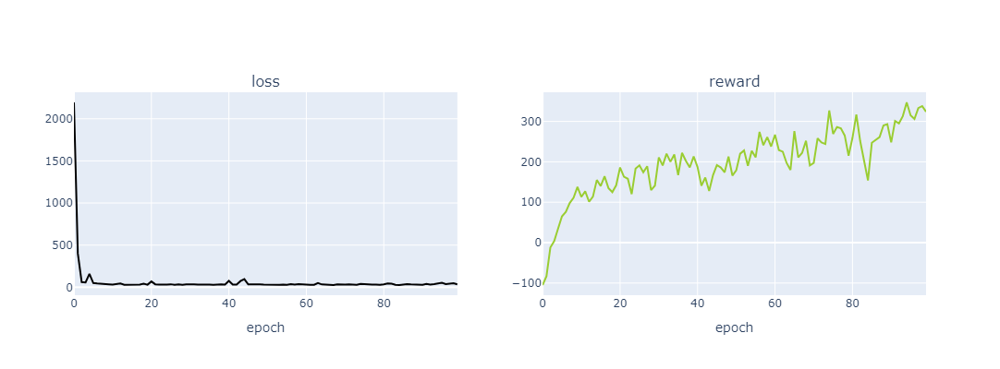

In [ ]:
plot_loss_reward(total_losses_dqn, total_rewards_dqn)

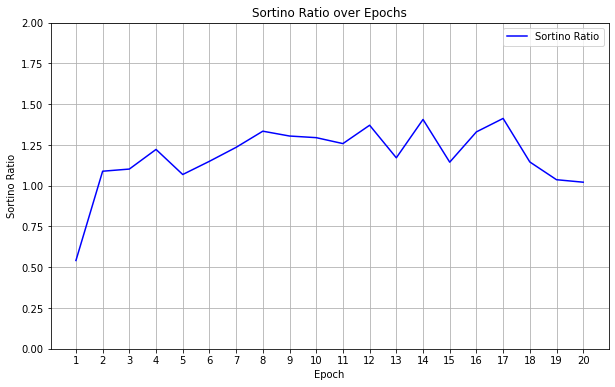

In [ ]:
plot_sortino_ratio(total_sortino_ratios_madqn)

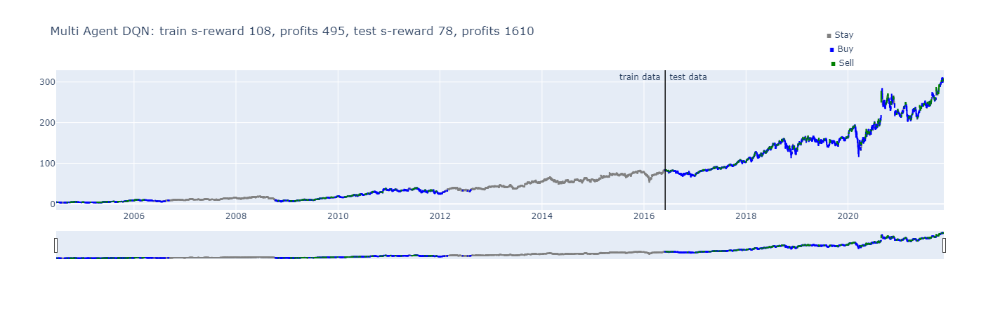

In [80]:
plot_train_test_by_q(Environment1(train), Environment1(test), Q_madqn, ' Multi Agent DQN')

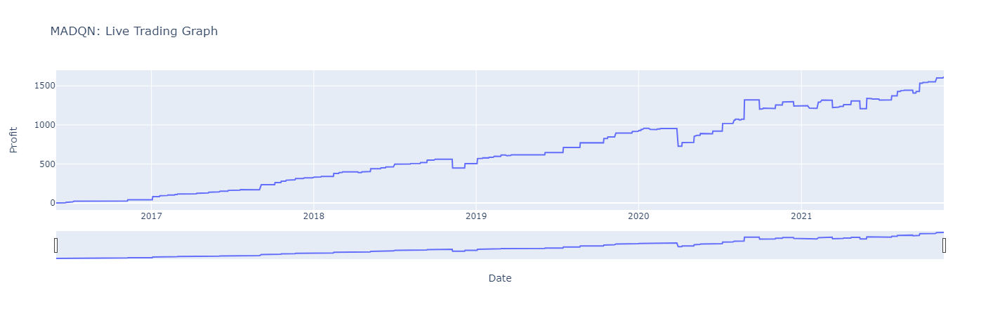

In [81]:
train_env = Environment1(train)
test_env = Environment1(test)
pobs = test_env.reset()
test_acts = []
test_rewards = []

for _ in range(len(test_env.data) - 1):
    pact = Q_madqn(np.array(pobs, dtype=np.float32).reshape(1, -1))
    pact = np.argmax(pact.data)
    test_acts.append(pact)
    
    obs, reward, done = test_env.step(pact)
    test_rewards.append(reward)

    pobs = obs

plot_live_trading(test_env, test_acts, 'MADQN')


## Ensemble Averaging

### Environment 2

In [88]:
class Environment2:
    
    def __init__(self, data, history_t=90):
        self.data = data
        self.history_t = history_t
        self.reset()
        
    def reset(self):
        self.t = 0
        self.done = False
        self.profits = 0
        self.positions = []
        self.position_value = 0
        self.history = [0 for _ in range(self.history_t)]
        return [self.position_value] + self.history  
    
    def step(self, act):
        reward = 0

        if act == 1:
            if self.t < len(self.data):
                self.positions.append(self.data.iloc[self.t, :]['Close'])
            else:
                self.done = True

        elif act == 2:  
            if len(self.positions) == 0:
                reward = -1
            else:
                profits = 0
                for p in self.positions:
                    if self.t < len(self.data):
                        profits += (self.data.iloc[self.t, :]['Close'] - p)
                    else:
                        self.done = True
                        break

                reward += profits
                self.profits += profits
                self.positions = []

        self.t += 1

        if self.t >= len(self.data):
            self.done = True

        if self.done:
            return [self.position_value] + self.history, reward, self.done

        self.position_value = 0
        for p in self.positions:
            if self.t < len(self.data):
                self.position_value += (self.data.iloc[self.t, :]['Close'] - p)

        self.history.pop(0)
        if self.t < len(self.data):
            self.history.append(self.data.iloc[self.t, :]['Close'] - self.data.iloc[(self.t - 1), :]['Close'])
        else:
            self.history.append(0)

        if reward > 0:
            reward = 1
        elif reward < 0:
            reward = -1

        return [self.position_value] + self.history, reward, self.done  



In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import chainer
import chainer.functions as F
import chainer.links as L
import copy
import time
import random
import plotly.graph_objects as go
from plotly.subplots import make_subplots

class EnsembleModel:
    def __init__(self, models):
        self.models = models

    def __call__(self, x):
        q_values = []
        for model in self.models:
            q_values.append(model(x))
        q_values = sum(q_values) / len(q_values)  
        return q_values

ensemble_model = EnsembleModel([Q_madqn, Q_dqn, Q_ddqn, Q_dddqn])

def train_test_ensemble(train_env, test_env, ensemble_model, algorithm_name, gamma=0.97, epochs=10):
    test_acts = []
    total_losses_ensemble = []
    total_sortino_ratios_train_ensemble = []
    train_rewards_ensemble = []  
    Q_values_ensemble = []  

    for epoch in range(epochs):
        epoch_loss = 0
        epoch_reward = 0
        pobs = train_env.reset()
        for _ in range(len(test_env.data) - 1):
            pact = ensemble_model(np.array(pobs, dtype=np.float32).reshape(1, -1))
            pact = np.argmax(pact.data)
            test_acts.append(pact)
            obs, reward, done = test_env.step(pact)
            epoch_reward += reward
            pobs = obs

            q = ensemble_model(np.array(pobs, dtype=np.float32).reshape(1, -1))
            maxq = np.max(ensemble_model(np.array(obs, dtype=np.float32).reshape(1, -1)).data)
            target = copy.deepcopy(q.data)
            target[:, pact] = reward + gamma * maxq
            total_loss = F.mean_squared_error(q, target)
            epoch_loss += total_loss.data

            Q_values_ensemble.append(q.data)

        total_losses_ensemble.append(epoch_loss / (len(test_env.data) - 1))
        train_rewards_ensemble.append(epoch_reward / (len(test_env.data) - 1))

        train_returns = np.array(train_rewards_ensemble)
        sortino_ratio_train = calculate_sortino_ratio(train_returns)
        total_sortino_ratios_train_ensemble.append(sortino_ratio_train)

    plot_sortino_ratio(total_sortino_ratios_train_ensemble)
    plot_train_test_by_q(train_env, test_env, ensemble_model, algorithm_name)

    print(f'Sortino Ratio (Train): {sortino_ratio_train}')

    return test_acts, total_losses_ensemble, train_rewards_ensemble, total_sortino_ratios_train_ensemble, ensemble_model


train_env = Environment2(train)
test_env = Environment2(test)


results = train_test_ensemble(train_env, test_env, ensemble_model, 'Ensemble Model', epochs=10)
test_acts_ensemble, total_losses_ensemble, train_rewards_ensemble, sortino_ratios_ensemble, updated_ensemble_model = results


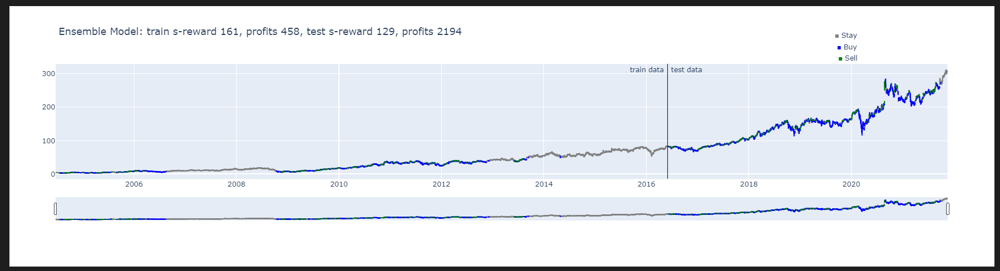

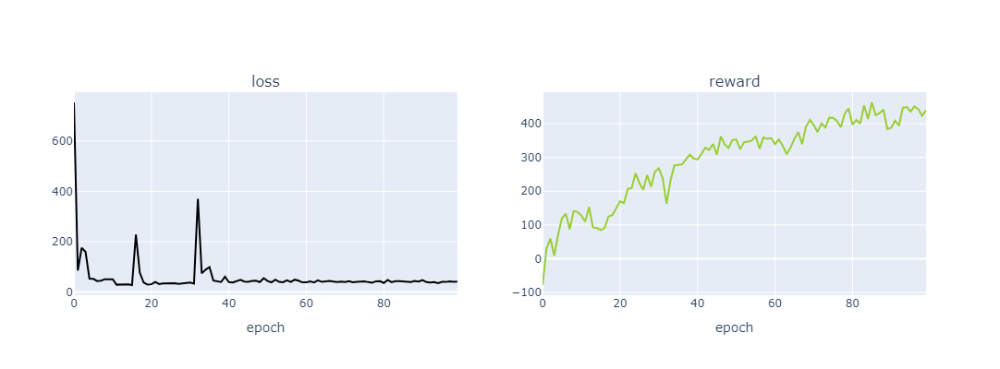

In [ ]:
plot_loss_reward(total_losses_madqn, total_rewards_madqn)

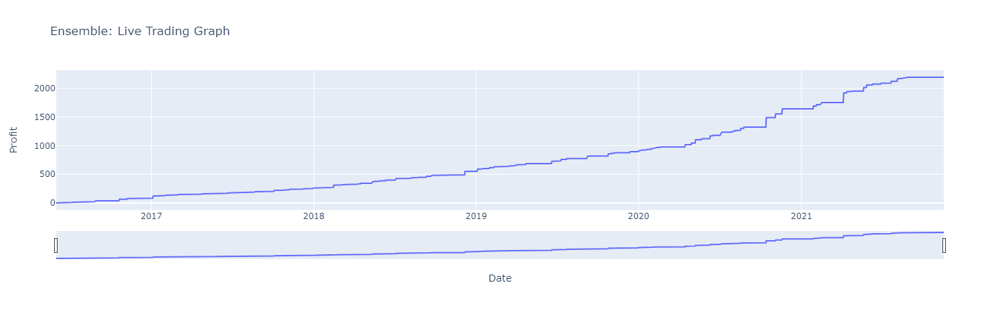

In [94]:
train_env = Environment1(train)
test_env = Environment1(test)
pobs = test_env.reset()
test_acts = []
test_rewards = []

for _ in range(len(test_env.data) - 1):
    pact = Q_madqn(np.array(pobs, dtype=np.float32).reshape(1, -1))
    pact = np.argmax(pact.data)
    test_acts.append(pact)
    
    obs, reward, done = test_env.step(pact)
    test_rewards.append(reward)

    pobs = obs

plot_live_trading(test_env, test_acts_ensemble, 'Ensemble')


## Comparision

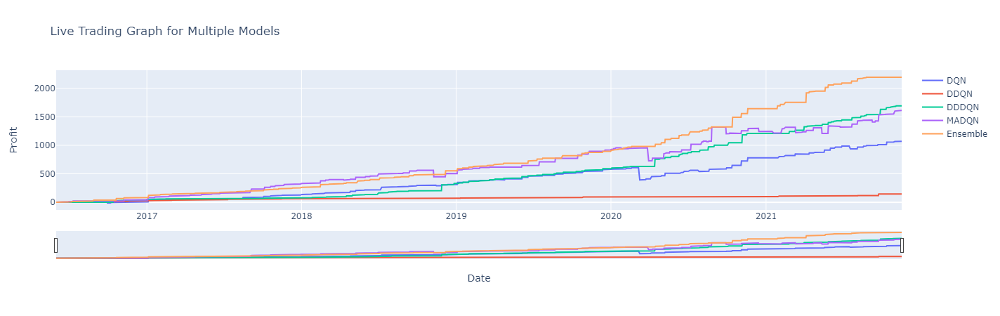

In [92]:
def plot_live_trading2(env_dict, test_acts_dict, algorithm_names):
    fig = make_subplots(rows=1, cols=1)
    for algo_name in algorithm_names:
        fig.add_trace(go.Scatter(x=[], y=[], mode='lines', name=algo_name), row=1, col=1)
    
    fig.update_layout(title='Live Trading Graph for Multiple Models',
                      xaxis_title='Date',
                      yaxis_title='Profit',
                      xaxis_rangeslider_visible=True)

    for algo_name in algorithm_names:
        test_env = env_dict[algo_name]
        test_env.reset()
        test_acts = test_acts_dict[algo_name]
        
        cumulative_profit = 0
        for i in range(len(test_env.data) - 1):
            act = test_acts[i]
            date = test_env.data.index[i]

            obs, _, done = test_env.step(act)
            cumulative_profit = test_env.profits

            fig.data[algorithm_names.index(algo_name)].x = list(fig.data[algorithm_names.index(algo_name)].x) + [date]
            fig.data[algorithm_names.index(algo_name)].y = list(fig.data[algorithm_names.index(algo_name)].y) + [cumulative_profit]

    fig.update_layout(xaxis_range=[fig.data[0].x[0], fig.data[0].x[-1]])
    fig.show()


test_env_env1 = Environment1(test)
test_env_env2 = Environment2(test)

env_dict = {
    'DQN': test_env_env1,
    'DDQN': test_env_env1,
    'DDDQN': test_env_env1,
    'MADQN': test_env_env1,
    'Ensemble': test_env_env2
}

test_acts_dict = {
    'DQN': [],
    'DDQN': [],
    'DDDQN': [],
    'MADQN': [],
    'Ensemble': []
}

def generate_actions(Q, test_env):
    pobs = test_env.reset()
    actions = []
    for _ in range(len(test_env.data) - 1):
        pact = Q(np.array(pobs, dtype=np.float32).reshape(1, -1))
        pact = np.argmax(pact.data)
        actions.append(pact)
        obs, _, done = test_env.step(pact)
        pobs = obs
    return actions

test_acts_dict['DQN'] = generate_actions(Q_dqn, env_dict['DQN'])
test_acts_dict['DDQN'] = generate_actions(Q_ddqn, env_dict['DDQN'])
test_acts_dict['DDDQN'] = generate_actions(Q_dddqn, env_dict['DDDQN'])
test_acts_dict['MADQN'] = generate_actions(Q_madqn, env_dict['MADQN'])


test_acts_dict['Ensemble'] = test_acts_ensemble

algorithm_names = ['DQN', 'DDQN', 'DDDQN', 'MADQN', 'Ensemble']

plot_live_trading2(env_dict, test_acts_dict, algorithm_names)